In [22]:
import re
import emoji
import contractions
from nltk.stem import WordNetLemmatizer
import spacy
from nltk.corpus import stopwords
import nltk
import numpy as np
# Download stopwords if not already
nltk.download("stopwords")
nltk.download("wordnet")

# Load spaCy
nlp = spacy.load("en_core_web_sm")

stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

def text_preprocessing(text):
    text = emoji.demojize(text)
    text = contractions.fix(text)
    text = text.lower()
    text = re.sub(r'\d{4}-\d{2}-\d{2}', 'DATE', text)
    text = re.sub(r'\d+', "NUM", text)
    text = re.sub(r'\b\w+@\w+\.\w+\b', 'EMAIL', text)
    text = re.sub(r'[^\w\s]', "", text)
    # Tokenize with spaCy
    doc = nlp(text)
    # Lemmatize + remove stopwords
    tokens = [
        lemmatizer.lemmatize(token.text) 
        for token in doc 
        if token.text not in stop_words and not token.is_space
    ]

    return " ".join(tokens)


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mudasir/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/mudasir/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [26]:
import os

dataset_path = "/home/mudasir/ankit/NLP/bbc"

topic = os.listdir(dataset_path)

del topic[topic.index('README.TXT')]

file_paths = {}

for t in topic:
    if t not in file_paths:
        file_paths[t] = []
    for file_name in os.listdir(os.path.join(dataset_path, t)):
        file_path = os.path.join(dataset_path, t, file_name)
        file_paths[t].append(file_path)

docs = {}
for t in file_paths.keys():
    if t not in docs:
        docs[t] = []
    for file_path in file_paths[t]:
        doc = []
        with open(file_path, 'r', encoding="utf-8", errors="ignore") as file:
            for line in file:
                line = text_preprocessing(line)
                line = re.sub(r'\n', '', line)
                doc.append(line)
        docs[t].append(' '.join(doc))

In [28]:
docs

{'sport': ['fitagain betsen france squad  france brought flanker serge betsen back squad face england twickenham sunday  player missed victory scotland injury must attend disciplinary hearing wednesday cited wasp serge good case confident play said france coach bernard laporte inexperienced nicolas ma jimmy marlu jeanphilippe grandclaude also included NUMman squad trio called pieter de villiers ludovic valbon aurelien rougerie picked injury france NUMNUM win saturday  laporte said confident betsen would cleared panel investigating alleged trip broke wasp centre stuart abbotts leg suspended would call imanol harinordoquy thomas lievremont said laporte dropped patrick tabacco missed serge badly scotland recovered thigh injury played saturday biarritz france regular backrow combination betsen harinordoquy olivier magne missing france side weekend injury laporte expected announce france starting lineup wednesday  forward nicolas ma sylvain marconnet olivier milloud william servat sebastien

In [29]:
corpus = [doc for t in docs for doc in docs[t]]

In [30]:
len(corpus)

2225

In [73]:
def word_cooccurence_matrix(docs , window_size):
    dic = {}
    for doc in docs:
        words = doc.split()
        for i, word in enumerate(words):
            if word not in dic:
                dic[word] = {}
            for j in range(max(0, i - window_size), min(len(words), i + window_size + 1)):
                if i != j:
                    neighbor = words[j]
                    if neighbor not in dic[word].keys():
                        dic[word][neighbor] = 0
                    dic[word][neighbor] += 1
    return dic

In [74]:
import pandas as pd
wc_matrix_dic = word_cooccurence_matrix(corpus, 5)
word_cooccurence_matrix_df = pd.DataFrame(wc_matrix_dic).fillna(0)
word_cooccurence_matrix_df.head(10)

,fitagain,betsen,france,squad,brought,flanker,serge,back,face,england,...,bordesley,deceive,concurrence,confrontational,patrolling,distinguishing,discernible,begging,instruct,areconsulting
betsen,1.0,0.0,5.0,3.0,2.0,3.0,6.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
france,2.0,5.0,34.0,10.0,2.0,2.0,2.0,7.0,9.0,47.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
squad,1.0,3.0,10.0,4.0,5.0,4.0,2.0,6.0,5.0,19.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
brought,1.0,2.0,2.0,5.0,2.0,1.0,1.0,9.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
fitagain,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
flanker,0.0,3.0,2.0,4.0,1.0,0.0,2.0,2.0,2.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
serge,0.0,6.0,2.0,2.0,1.0,2.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
back,0.0,1.0,7.0,6.0,9.0,2.0,1.0,24.0,8.0,17.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
face,0.0,1.0,9.0,5.0,1.0,2.0,1.0,8.0,6.0,13.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
england,0.0,1.0,47.0,19.0,0.0,1.0,1.0,17.0,13.0,60.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [75]:

def dict_to_matrix(dic):
    vocab = list(dic.keys())
    vocab_index = {word: i for i, word in enumerate(vocab)}
    
    # Initialize matrix
    matrix = np.zeros((len(vocab), len(vocab)), dtype=np.float32)
    
    for word, neighbors in dic.items():
        i = vocab_index[word]
        for neighbor, count in neighbors.items():
            j = vocab_index[neighbor]
            matrix[i, j] = count
    
    return vocab, matrix


In [76]:
vocab , wc_matrix = dict_to_matrix(wc_matrix_dic)

In [77]:
word = "like"
idx = vocab.index(word)
word_vector = wc_matrix[idx]

print("Vector for 'like':", word_vector)
print("Shape:", word_vector.shape)

Vector for 'like': [0. 0. 3. ... 0. 0. 0.]
Shape: (28032,)


In [78]:
def PPMI(wc_matrix):
    # Compute the PPMI matrix
    unigram_count = {}
    total_unigram_count = 0
    for word in wc_matrix:
        unigram_count[word] = sum(wc_matrix[word].values())
        total_unigram_count += unigram_count[word]

    bigram_count = 0
    for word1 in wc_matrix:
        for word2 in wc_matrix[word1]:
            bigram_count += wc_matrix[word1][word2]

    # Compute PPMI
    ppmi = {}
    for word1 in wc_matrix:
        ppmi[word1] = {}
        for word2 in wc_matrix[word1]:
            if word2 not in ppmi[word1]:
                ppmi[word1][word2] = {}
            pmi = (wc_matrix[word1][word2] / bigram_count) / ((unigram_count[word1] / total_unigram_count) * (unigram_count[word2] / total_unigram_count))
            ppmi[word1][word2] = max(0, np.log2(pmi))

    return ppmi


In [79]:
ppmi_matrix_dic = PPMI(wc_matrix_dic)
_ , ppmi_matrix = dict_to_matrix(ppmi_matrix_dic)

In [ ]:
ppmi_matrix_df = pd.DataFrame.from_dict(ppmi_matrix_dic).fillna(0)
ppmi_matrix_df


In [80]:
word = "like"
idx = vocab.index(word)
word_vector = ppmi_matrix[idx]

print("Vector for 'like':", word_vector)
print("Shape:", word_vector.shape)

Vector for 'like': [0. 0. 0. ... 0. 0. 0.]
Shape: (28032,)


In [81]:
from sklearn.decomposition import TruncatedSVD

def reduce_with_svd(ppmi_matrix_df, dim=300):
    svd = TruncatedSVD(n_components=dim)
    reduced_matrix = svd.fit_transform(ppmi_matrix_df)
    return reduced_matrix

In [82]:
df_reduced_svd = pd.DataFrame(
    reduce_with_svd(ppmi_matrix_df, dim=300),
    index=ppmi_matrix_df.index,             # words as row labels
    columns=[f"dim{i+1}" for i in range(300)]  # nicer column names
)
df_reduced_svd

NameError: name 'ppmi_matrix_df' is not defined

In [153]:
def get_word_vector(word, df_reduced_svd):
    if word in df_reduced_svd.index:
        return df_reduced_svd.loc[word].values
    else:
        raise ValueError(f"Word '{word}' not in vocabulary")

In [154]:
word = "like"
vector = get_word_vector(word, df_reduced_svd)

print(f"Word vector for '{word}':")
print(vector)
print("Shape:", vector.shape)

Word vector for 'like':
[ 3.31863421e+01  6.18474296e-01  1.59280940e+01 -2.45250620e+01
 -1.29816764e+01 -1.04765677e+01 -1.63973203e+00 -8.85050270e+00
 -4.13377254e-01 -9.86906910e+00 -4.86825729e+00  1.43987832e+00
  5.18184265e+00 -7.31917241e+00  9.66350792e+00  4.15799840e+00
 -3.58953108e+00  4.71125266e-01  6.46349316e+00 -1.34672070e+00
 -1.42282416e+00  3.16435372e-03  5.04614412e-01  7.76681061e+00
  1.87810993e+00 -8.04794850e+00  2.07380902e-01 -1.37459388e-01
 -5.31776712e+00 -1.25763228e+00  5.32036497e+00 -4.25921974e+00
  2.93966957e+00  5.20803117e+00 -6.30144131e-01  2.64589133e+00
 -2.69073461e+00  2.38838035e+00 -5.35045180e-01  2.46278080e-02
  9.08370782e+00  2.12608560e+00  3.54975883e+00  6.29797028e+00
 -3.22111763e+00  1.48824416e+00 -2.38123309e+00 -2.08076711e-01
  9.04291661e-01 -7.49532128e+00  4.64834886e+00 -2.46278418e+00
 -4.95099154e-01 -1.89492453e+00 -1.06869474e+01  5.15291234e+00
 -3.96479834e-01 -3.04847792e-01 -3.60318242e-01  9.64457546e-01
 

In [42]:
def cosine_similarity(vec_a, vec_b):
    dot_product = np.dot(vec_a, vec_b)
    norm_a = np.linalg.norm(vec_a)
    norm_b = np.linalg.norm(vec_b)
    if norm_a == 0 or norm_b == 0:
        return 0.0
    return dot_product / ((norm_a * norm_b)+ 1e-10)


In [156]:
    
def get_top_k_similar_words(word , vsm_matrix , vocab ,k , vsm = None):
    similar_words = []

    for contex_word in vocab:
        if(contex_word != word):
            if vsm == "svd":
                similar_words.append((contex_word , cosine_similarity(get_word_vector(word , vsm_matrix) , get_word_vector(contex_word ,vsm_matrix))))
            else:
                i = vocab.index(word)
                j = vocab.index(contex_word)
                similar_words.append((contex_word , cosine_similarity(vsm_matrix[i] , vsm_matrix[j])))
    return sorted(similar_words , key = lambda x : x[1] , reverse = True)[:k]


In [157]:
get_top_k_similar_words("football" , wc_matrix ,vocab ,  5 )

[('club', 0.7022640101738364),
 ('team', 0.6504717712496033),
 ('player', 0.6403953386876813),
 ('game', 0.6307966870600968),
 ('played', 0.6203865517291769)]

In [158]:
get_top_k_similar_words("football" , ppmi_matrix ,vocab ,  5 )

[('league', 0.17956145313899258),
 ('club', 0.16933903090646688),
 ('association', 0.13558925296232358),
 ('manager', 0.13163326928865723),
 ('coach', 0.12921303793292002)]

In [159]:
get_top_k_similar_words("football" , df_reduced_svd ,vocab , 5 , vsm = "svd")

[('club', 0.5777019629706759),
 ('nonchampions', 0.5592206461116978),
 ('league', 0.5530662172629732),
 ('reprimanded', 0.5486500761487951),
 ('americaNUMs', 0.5462390376088639)]

In [160]:
import random 
Query_word = {}
k = 5
for t in topic:
    content = []
    for doc in docs[t]:
        content.extend(doc.split())
    random.shuffle(content)
    content = [word for word in content if word in vocab]
    Query_word[t] = content[:k]


In [161]:
Query_word

{'sport': ['second', 'looking', 'nothing', 'otherwise', 'appear'],
 'entertainment': ['u', 'burton', 'bowl', 'everybodys', 'oscar'],
 'tech': ['chan', 'report', 'time', 'population', 'convergence'],
 'business': ['job', 'beirut', 'NUM', 'investment', 'succeed'],
 'politics': ['really', 'said', 'win', 'information', 'call']}

In [162]:
from tqdm import tqdm
word_cooccurence_matrix_report = {}

for t in tqdm(Query_word):
    for word in Query_word[t]:

            word_cooccurence_matrix_report[word] = [contex_word for contex_word , _  in get_top_k_similar_words(word , wc_matrix ,vocab , 5)]



100%|██████████| 5/5 [05:32<00:00, 66.59s/it]


In [163]:
word_cooccurence_matrix_report_df = pd.DataFrame.from_dict(word_cooccurence_matrix_report)

In [164]:
word_cooccurence_matrix_report_df

,second,looking,nothing,otherwise,appear,u,burton,bowl,everybodys,oscar,...,job,beirut,NUM,investment,succeed,really,said,win,information,call
0,first,would,would,like,also,uk,march,miniconcert,drowning,nomination,...,however,lebanese,january,company,said,going,say,winning,people,use
1,set,get,think,never,one,company,february,super,osbournes,award,...,also,hariri,since,firm,added,think,added,match,use,people
2,third,could,mr,thought,come,also,since,breastbaring,really,best,...,added,assassinated,million,however,glazer,good,also,victory,way,service
3,NUM,way,believe,able,new,firm,NUM,mischer,think,nominated,...,economy,solidere,march,also,club,like,could,final,could,make
4,final,still,problem,see,could,NUM,died,janet,something,film,...,still,blom,year,u,say,get,government,time,system,could


---
### Word2Vec

In [24]:
import torch
import torch.nn as nn
import torch.optim as optim
from collections import Counter
import random
from tqdm import tqdm

In [31]:
from collections import Counter

word2vec_corpus = []
for doc in corpus:
    for word in doc.split():
        word2vec_corpus.append(word)

len(word2vec_corpus)

492973

In [32]:

word_counts = Counter(word2vec_corpus)
vocab = sorted(word_counts, key=word_counts.get, reverse=True)
word2idx = {w: idx for idx, w in enumerate(vocab)}
idx2word = {idx: w for w, idx in word2idx.items()}
vocab_size = len(vocab)

print("Vocab size:", vocab_size)

Vocab size: 28032


In [33]:
def generate_skipgram_data(corpus, window_size=5):
    pairs = []
    for i, target_word in enumerate(corpus):
        target_idx = word2idx[target_word]
        # context words within window
        for j in range(max(0, i - window_size), min(len(corpus), i + window_size + 1)):
            if i != j:
                context_idx = word2idx[corpus[j]]
                pairs.append((target_idx, context_idx))
    return pairs

pairs = generate_skipgram_data(word2vec_corpus, window_size=5)
print("Number of training pairs:", len(pairs))


Number of training pairs: 4929700


In [34]:
class SkipGramNegSampling(nn.Module):
    def __init__(self, vocab_size, embedding_dim):
        super(SkipGramNegSampling, self).__init__()
        self.target_embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.context_embeddings = nn.Embedding(vocab_size, embedding_dim)

        # Initialize embeddings
        initrange = 0.5 / embedding_dim
        self.target_embeddings.weight.data.uniform_(-initrange, initrange)
        self.context_embeddings.weight.data.uniform_(-initrange, initrange)

    def forward(self, target, context, negative_samples):
        # Embeddings
        target_emb = self.target_embeddings(target)         # (batch, dim)
        context_emb = self.context_embeddings(context)       # (batch, dim)
        neg_emb = self.context_embeddings(negative_samples)  # (batch, n_neg, dim)

        # Positive score (target dot context)
        pos_score = torch.mul(target_emb, context_emb).sum(dim=1)  # (batch)
        pos_loss = torch.log(torch.sigmoid(pos_score))

        # Negative score (target dot negative samples)
        neg_score = torch.bmm(neg_emb, target_emb.unsqueeze(2)).squeeze()  # (batch, n_neg)
        neg_loss = torch.log(torch.sigmoid(-neg_score)).sum(dim=1)

        return -(pos_loss + neg_loss).mean()


In [35]:
def get_negative_samples(batch_size, n_neg=5):
    # Sample negatives from unigram distribution (approx)
    negative_samples = torch.randint(low=0, high=vocab_size, size=(batch_size, n_neg))
    return negative_samples


In [ ]:
# Hyperparameters
embedding_dim = 300
window_size = 5
n_neg = 5
batch_size = 512
epochs = 45
learning_rate = 0.001

# Model, optimizer
device = torch.device("cuda:4" if torch.cuda.is_available() else "cpu")
model = SkipGramNegSampling(vocab_size, embedding_dim).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Convert pairs to tensor
pairs_tensor = torch.tensor(pairs, dtype=torch.long)

# Training
for epoch in tqdm(range(epochs)):
    total_loss = 0
    random.shuffle(pairs)

    for i in tqdm(range(0, len(pairs), batch_size)):
        batch = pairs[i:i+batch_size]
        if len(batch) == 0:
            continue
        target, context = zip(*batch)
        target = torch.tensor(target, dtype=torch.long).to(device)
        context = torch.tensor(context, dtype=torch.long).to(device)

        negative_samples = get_negative_samples(len(batch), n_neg).to(device)

        optimizer.zero_grad()
        loss = model(target, context, negative_samples)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {total_loss:.4f}")


  2%|▏         | 1/45 [02:30<1:50:09, 150.22s/it]

Epoch 1, Loss: 14792.1959


  4%|▍         | 2/45 [04:58<1:47:01, 149.35s/it]

Epoch 2, Loss: 12377.0445


In [ ]:
torch.save(model , "word2vec_model.pth")

In [54]:
# Load the model saved earlier with model.save("word2vec_model.pth")
model = torch.load("/home/mudasir/ankit/NLP/Lab_04/Ankit_model.pth")
 
model.eval()

SkipGramNegSampling(
  (target_embeddings): Embedding(28032, 300)
  (context_embeddings): Embedding(28032, 300)
)

In [55]:
embeddings = model.target_embeddings.weight.data.cpu().numpy()

# Example: get nearest words to "king"
import numpy as np

def get_similar_words(word, topn=5):
    if word not in word2idx:
        return []
    idx = word2idx[word]
    word_vec = embeddings[idx]
    similarities = np.dot(embeddings, word_vec) / (
        np.linalg.norm(embeddings, axis=1) * np.linalg.norm(word_vec) + 1e-10
    )
    similar_indices = similarities.argsort()[-topn-1:][::-1][1:]
    return [idx2word[i] for i in similar_indices]

print(get_similar_words("king"))


['kechiches', 'overspill', 'desplechins', 'amalric', 'auteuil']


In [56]:

def solve_analogy(a, b, c, embeddings, word2idx, idx2word, topn=1):
    # Check if all words are in the vocabulary
    if a not in word2idx or b not in word2idx or c not in word2idx:
        return f"Cannot solve analogy: one or more words ('{a}', '{b}', '{c}') not in vocabulary"
    
    # Get word indices
    idx_a = word2idx[a]
    idx_b = word2idx[b]
    idx_c = word2idx[c]
    
    # Compute vector: Word2Vec(a) - Word2Vec(b) + Word2Vec(c)
    result_vec = embeddings[idx_a] - embeddings[idx_b] + embeddings[idx_c]
    
    # Compute similarities with all words in the vocabulary
    similarities = {}
    for idx, vec in enumerate(embeddings):
        if idx not in [idx_a, idx_b, idx_c]:  # Exclude input words
            sim = cosine_similarity(result_vec, vec)
            similarities[idx2word[idx]] = sim
    
    # Get the top-n similar words
    top_similar = sorted(similarities.items(), key=lambda item: item[1], reverse=True)[:topn]
    return top_similar

# Analogy questions
analogies = [
    ("business", "profit", "politics"),
    ("britain", "london", "france"),
    ("sport", "football", "tech"),
    ("minister", "government", "player"),
    ("movie", "entertainment", "computer")
]

# Solve each analogy
analogy_results = {}
for a, b, c in analogies:
    result = solve_analogy(a, b, c, embeddings, word2idx, idx2word)
    analogy_results[f"{a} is to {b} as {c} is to ?"] = result

# Display results
for analogy, result in analogy_results.items():
    print(f"\nAnalogy: {analogy}")
    if isinstance(result, str):
        print(result)
    else:
        for word, score in result:
            print(f"Predicted: {word} (cosine similarity: {score:.4f})")


Analogy: business is to profit as politics is to ?
Predicted: unfulfilling (cosine similarity: 0.3586)

Analogy: britain is to london as france is to ?
Predicted: botched (cosine similarity: 0.4542)

Analogy: sport is to football as tech is to ?
Predicted: summed (cosine similarity: 0.3596)

Analogy: minister is to government as player is to ?
Predicted: prime (cosine similarity: 0.4217)

Analogy: movie is to entertainment as computer is to ?
Predicted: torchhmmmmm (cosine similarity: 0.2776)


In [1]:
superheroes = [
    # Marvel Heroes
    "Iron Man", "Captain America", "Thor", "Hulk", "Black Widow", "Hawkeye", "Spider-Man",
    "Doctor Strange", "Black Panther", "Scarlet Witch", "Vision", "Ant-Man", "Wasp",
    "Falcon", "Winter Soldier", "Star-Lord", "Gamora", "Drax", "Rocket Raccoon", "Groot",

    # DC Heroes
    "Superman", "Batman", "Wonder Woman", "Flash", "Aquaman", "Cyborg", "Green Lantern",
    "Martian Manhunter", "Shazam", "Green Arrow", "Doctor Fate",

    # Marvel Villains
    "Thanos", "Loki", "Ultron", "Red Skull", "Hela", "Killmonger", "Green Goblin", 
    "Doctor Octopus", "Venom", "Vulture", "Mysterio",

    # DC Villains
    "Joker", "Lex Luthor", "Darkseid", "Reverse Flash", "Black Manta", "Deathstroke",
    "Harley Quinn", "Brainiac", "General Zod", "Bane", "Riddler", "Scarecrow",
    "Black Adam"
]


In [2]:
relationships = [
    # Marvel Avengers (existing)
    ("Iron Man", "Captain America"),
    ("Iron Man", "Spider-Man"),
    ("Captain America", "Black Widow"),
    ("Thor", "Hulk"),
    ("Hulk", "Black Widow"),
    ("Black Widow", "Hawkeye"),
    ("Hawkeye", "Thor"),
    ("Doctor Strange", "Iron Man"),
    ("Doctor Strange", "Spider-Man"),
    ("Scarlet Witch", "Vision"),
    ("Scarlet Witch", "Doctor Strange"),
    ("Vision", "Iron Man"),
    ("Black Panther", "Captain America"),
    ("Black Panther", "Winter Soldier"),
    ("Falcon", "Captain America"),
    ("Winter Soldier", "Falcon"),
    ("Ant-Man", "Wasp"),
    ("Ant-Man", "Captain America"),
    ("Star-Lord", "Gamora"),
    ("Star-Lord", "Drax"),
    ("Star-Lord", "Rocket Raccoon"),
    ("Star-Lord", "Groot"),
    ("Gamora", "Drax"),
    ("Gamora", "Rocket Raccoon"),
    ("Drax", "Groot"),
    ("Rocket Raccoon", "Groot"),
    ("Star-Lord", "Iron Man"),
    ("Iron Man", "Hulk"),
    ("Iron Man", "Thor"),
    ("Iron Man", "Falcon"),
    ("Iron Man", "Ant-Man"),
    ("Iron Man", "Black Panther"),
    ("Iron Man", "Gamora"),

    # Marvel Villains
    ("Thanos", "Gamora"),
    ("Thanos", "Iron Man"),
    ("Thanos", "Doctor Strange"),
    ("Thanos", "Thor"),
    ("Thanos", "Scarlet Witch"),
    ("Loki", "Thor"),
    ("Loki", "Hulk"),
    ("Loki", "Doctor Strange"),
    ("Ultron", "Iron Man"),
    ("Ultron", "Vision"),
    ("Red Skull", "Captain America"),
    ("Hela", "Thor"),
    ("Killmonger", "Black Panther"),
    ("Green Goblin", "Spider-Man"),
    ("Doctor Octopus", "Spider-Man"),
    ("Venom", "Spider-Man"),
    ("Vulture", "Spider-Man"),
    ("Mysterio", "Spider-Man"),

    # DC Justice League (existing)
    ("Superman", "Batman"),
    ("Superman", "Wonder Woman"),
    ("Superman", "Flash"),
    ("Superman", "Aquaman"),
    ("Superman", "Cyborg"),
    ("Batman", "Wonder Woman"),
    ("Batman", "Flash"),
    ("Batman", "Aquaman"),
    ("Wonder Woman", "Aquaman"),
    ("Wonder Woman", "Cyborg"),
    ("Flash", "Cyborg"),
    ("Green Lantern", "Flash"),
    ("Martian Manhunter", "Superman"),
    ("Shazam", "Superman"),
    ("Green Arrow", "Batman"),
    ("Doctor Fate", "Batman"),

    # DC Villains
    ("Joker", "Batman"),
    ("Harley Quinn", "Joker"),
    ("Lex Luthor", "Superman"),
    ("Darkseid", "Superman"),
    ("Darkseid", "Wonder Woman"),
    ("Reverse Flash", "Flash"),
    ("Black Manta", "Aquaman"),
    ("Deathstroke", "Batman"),
    ("Brainiac", "Superman"),
    ("General Zod", "Superman"),
    ("Bane", "Batman"),
    ("Riddler", "Batman"),
    ("Scarecrow", "Batman"),
    ("Black Adam", "Shazam"),
    ("Black Adam", "Superman"),

    # Marvel x DC Crossover (fun links)
    ("Batman", "Iron Man"),         # tech geniuses
    ("Superman", "Thor"),           # gods-like beings
    ("Wonder Woman", "Black Widow"),# warriors
    ("Flash", "Spider-Man"),        # speed/quick
    ("Thanos", "Darkseid"),         # ultimate villains
    ("Joker", "Green Goblin"),      # chaotic tricksters
    ("Lex Luthor", "Iron Man"),     # genius rivals
]


In [3]:
import networkx as nx
# Create graph
G = nx.Graph()
G.add_nodes_from(superheroes)  # add superheroes as nodes
G.add_edges_from(relationships)  # add edges from relationships

# Mapping node IDs → superhero names
# (NetworkX already uses names as nodes, but let’s create an ID mapping too)
id_map = {i: name for i, name in enumerate(G.nodes())}
name_map = {name: i for i, name in id_map.items()}

print("Node ID → Name mapping:")
for node_id, name in id_map.items():
    print(f"{node_id} → {name}")

Node ID → Name mapping:
0 → Iron Man
1 → Captain America
2 → Thor
3 → Hulk
4 → Black Widow
5 → Hawkeye
6 → Spider-Man
7 → Doctor Strange
8 → Black Panther
9 → Scarlet Witch
10 → Vision
11 → Ant-Man
12 → Wasp
13 → Falcon
14 → Winter Soldier
15 → Star-Lord
16 → Gamora
17 → Drax
18 → Rocket Raccoon
19 → Groot
20 → Superman
21 → Batman
22 → Wonder Woman
23 → Flash
24 → Aquaman
25 → Cyborg
26 → Green Lantern
27 → Martian Manhunter
28 → Shazam
29 → Green Arrow
30 → Doctor Fate
31 → Thanos
32 → Loki
33 → Ultron
34 → Red Skull
35 → Hela
36 → Killmonger
37 → Green Goblin
38 → Doctor Octopus
39 → Venom
40 → Vulture
41 → Mysterio
42 → Joker
43 → Lex Luthor
44 → Darkseid
45 → Reverse Flash
46 → Black Manta
47 → Deathstroke
48 → Harley Quinn
49 → Brainiac
50 → General Zod
51 → Bane
52 → Riddler
53 → Scarecrow
54 → Black Adam


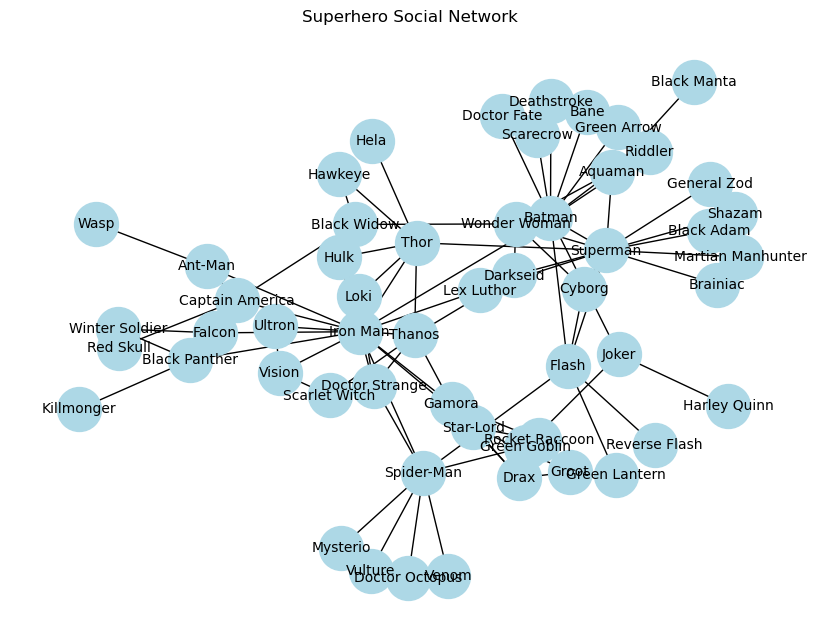

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G, seed=3)  # layout for visualization
nx.draw(G, pos, with_labels=True, node_size=1000, node_color="lightblue", font_size=10)
plt.title("Superhero Social Network")
plt.show()


In [5]:
import random
import networkx as nx

def random_walk_no_repeat(G, start_node, walk_length=5):
    walk = [start_node]
    while len(walk) < walk_length:
        neighbors = list(G.neighbors(walk[-1]))
        # remove already visited nodes
        neighbors = [n for n in neighbors if n not in walk]
        if not neighbors:
            break  # no unvisited neighbors left
        next_node = random.choice(neighbors)
        walk.append(next_node)
    return walk

# Generate corpus of walks
def build_corpus(G, num_walks=10, walk_length=5):
    corpus = []
    nodes = list(G.nodes())
    for _ in range(num_walks):
        start = random.choice(nodes)
        walk = random_walk_no_repeat(G, start, walk_length)
        corpus.append(walk)
    return corpus


In [6]:
# Suppose G is your Marvel + DC graph
super_hero_and_villan_corpus = build_corpus(G, num_walks=100, walk_length=20)

for seq in super_hero_and_villan_corpus:
    print(seq)


['Groot', 'Drax', 'Star-Lord', 'Iron Man', 'Ultron', 'Vision', 'Scarlet Witch', 'Thanos', 'Gamora', 'Rocket Raccoon']
['Red Skull', 'Captain America', 'Falcon', 'Iron Man', 'Vision', 'Ultron']
['Gamora', 'Drax', 'Groot', 'Rocket Raccoon', 'Star-Lord', 'Iron Man', 'Doctor Strange', 'Thanos', 'Darkseid', 'Wonder Woman', 'Cyborg', 'Flash', 'Superman', 'Shazam', 'Black Adam']
['Black Widow', 'Captain America', 'Black Panther', 'Killmonger']
['Gamora', 'Drax', 'Star-Lord', 'Iron Man', 'Thanos', 'Thor', 'Hela']
['Deathstroke', 'Batman', 'Doctor Fate']
['Brainiac', 'Superman', 'Batman', 'Iron Man', 'Thanos', 'Scarlet Witch', 'Doctor Strange', 'Spider-Man', 'Mysterio']
['Green Lantern', 'Flash', 'Cyborg', 'Wonder Woman', 'Batman', 'Iron Man', 'Hulk', 'Black Widow', 'Captain America', 'Falcon', 'Winter Soldier', 'Black Panther', 'Killmonger']
['Brainiac', 'Superman', 'Darkseid', 'Thanos', 'Doctor Strange', 'Iron Man', 'Ultron', 'Vision', 'Scarlet Witch']
['Thor', 'Hawkeye', 'Black Widow', 'Capt

In [7]:
word2idx = {word: i for i, word in enumerate(superheroes)}
idx2word = {i: word for word, i in word2idx.items()}

In [8]:

def generate_skipgram_pairs(corpus, window_size=2):
    pairs = []
    for sentence in corpus:
        indices = [word2idx[w] for w in sentence]
        for center_pos, center in enumerate(indices):
            for w in range(-window_size, window_size+1):
                context_pos = center_pos + w
                if context_pos < 0 or context_pos >= len(indices) or context_pos == center_pos:
                    continue
                pairs.append((center, indices[context_pos]))
    return pairs

In [9]:
pairs = generate_skipgram_pairs(super_hero_and_villan_corpus, window_size=5)
print(f"Number of training pairs: {len(pairs)}")

Number of training pairs: 4046


In [10]:
import torch
import torch.nn as nn
import torch.optim as optim

class SkipGramNegSampling(nn.Module):
    def __init__(self, vocab_size, embedding_dim):
        super().__init__()
        self.target_embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.context_embeddings = nn.Embedding(vocab_size, embedding_dim)
        initrange = 0.5 / embedding_dim
        self.target_embeddings.weight.data.uniform_(-initrange, initrange)
        self.context_embeddings.weight.data.uniform_(-initrange, initrange)

    def forward(self, target, context, negatives):
        # embeddings
        target_emb = self.target_embeddings(target)           # (batch, dim)
        context_emb = self.context_embeddings(context)        # (batch, dim)
        neg_emb = self.context_embeddings(negatives)          # (batch, n_neg, dim)

        # positive score
        pos_score = torch.mul(target_emb, context_emb).sum(dim=1)  # (batch,)
        pos_loss = torch.log(torch.sigmoid(pos_score) + 1e-9)

        # negative score
        neg_score = torch.bmm(neg_emb, target_emb.unsqueeze(2)).squeeze()  # (batch, n_neg)
        neg_loss = torch.log(torch.sigmoid(-neg_score) + 1e-9).sum(dim=1)

        return -(pos_loss + neg_loss).mean()

In [11]:
def get_negative_samples(batch_size, n_neg=5):
    # Sample negatives from unigram distribution (approx)
    negative_samples = torch.randint(low=0, high=vocab_size, size=(batch_size, n_neg))
    return negative_samples

In [12]:
vocab_size = len(superheroes)
embedding_dim = 5
model = SkipGramNegSampling(vocab_size, embedding_dim)
optimizer = optim.Adam(model.parameters(), lr=0.01)

In [13]:
# Prepare training data
targets, contexts = zip(*pairs)
targets = torch.tensor(targets, dtype=torch.long)
contexts = torch.tensor(contexts, dtype=torch.long)

In [127]:
from tqdm import tqdm
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
model.to(device)
# Train
n_epochs = 5
batch_size = 64
n_neg = 5
# Convert pairs to tensor
pairs_tensor = torch.tensor(pairs, dtype=torch.long)
epochs = 30
# Training


for epoch in tqdm(range(epochs)):
    total_loss = 0
    random.shuffle(pairs)

    for i in range(0, len(pairs), batch_size):
        batch = pairs[i:i+batch_size]
        if len(batch) == 0:
            continue
        target, context = zip(*batch)
        target = torch.tensor(target, dtype=torch.long).to(device)
        context = torch.tensor(context, dtype=torch.long).to(device)

        negative_samples = get_negative_samples(len(batch), n_neg).to(device)

        optimizer.zero_grad()
        loss = model(target, context, negative_samples)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {total_loss:.4f}")



# Save full model
torch.save(model.state_dict(), "super_hero_and_villan_word2vec.pth")

# Save embeddings separately (as tensor)
torch.save(model.target_embeddings.weight.data, "super_hero_and_villan_word2vec.pt")

  3%|▎         | 1/30 [00:00<00:18,  1.59it/s]

Epoch 1, Loss: 223.1681


  7%|▋         | 2/30 [00:01<00:17,  1.62it/s]

Epoch 2, Loss: 151.9872


 10%|█         | 3/30 [00:01<00:16,  1.61it/s]

Epoch 3, Loss: 146.0191


 13%|█▎        | 4/30 [00:02<00:16,  1.62it/s]

Epoch 4, Loss: 142.9576


 17%|█▋        | 5/30 [00:03<00:15,  1.64it/s]

Epoch 5, Loss: 139.2915


 20%|██        | 6/30 [00:03<00:14,  1.63it/s]

Epoch 6, Loss: 137.3807


 23%|██▎       | 7/30 [00:04<00:14,  1.63it/s]

Epoch 7, Loss: 137.2053


 27%|██▋       | 8/30 [00:04<00:13,  1.64it/s]

Epoch 8, Loss: 135.3746


 30%|███       | 9/30 [00:05<00:12,  1.64it/s]

Epoch 9, Loss: 134.2877


 33%|███▎      | 10/30 [00:06<00:13,  1.51it/s]

Epoch 10, Loss: 133.5182


 37%|███▋      | 11/30 [00:06<00:12,  1.55it/s]

Epoch 11, Loss: 132.7538


 40%|████      | 12/30 [00:07<00:11,  1.58it/s]

Epoch 12, Loss: 132.2924


 43%|████▎     | 13/30 [00:08<00:10,  1.61it/s]

Epoch 13, Loss: 130.6597


 47%|████▋     | 14/30 [00:08<00:09,  1.62it/s]

Epoch 14, Loss: 129.9978


 50%|█████     | 15/30 [00:09<00:09,  1.63it/s]

Epoch 15, Loss: 129.2880


 53%|█████▎    | 16/30 [00:09<00:08,  1.64it/s]

Epoch 16, Loss: 130.3895


 57%|█████▋    | 17/30 [00:10<00:07,  1.64it/s]

Epoch 17, Loss: 129.8869


 60%|██████    | 18/30 [00:11<00:07,  1.64it/s]

Epoch 18, Loss: 129.2454


 63%|██████▎   | 19/30 [00:11<00:06,  1.64it/s]

Epoch 19, Loss: 128.8971


 67%|██████▋   | 20/30 [00:12<00:06,  1.64it/s]

Epoch 20, Loss: 129.5774


 70%|███████   | 21/30 [00:12<00:05,  1.65it/s]

Epoch 21, Loss: 128.5737


 73%|███████▎  | 22/30 [00:13<00:04,  1.65it/s]

Epoch 22, Loss: 129.0644


 77%|███████▋  | 23/30 [00:14<00:04,  1.66it/s]

Epoch 23, Loss: 128.9821


 80%|████████  | 24/30 [00:14<00:03,  1.66it/s]

Epoch 24, Loss: 128.0874


 83%|████████▎ | 25/30 [00:15<00:03,  1.66it/s]

Epoch 25, Loss: 128.4221


 87%|████████▋ | 26/30 [00:15<00:02,  1.66it/s]

Epoch 26, Loss: 127.8263


 90%|█████████ | 27/30 [00:16<00:01,  1.66it/s]

Epoch 27, Loss: 128.8808


 93%|█████████▎| 28/30 [00:17<00:01,  1.66it/s]

Epoch 28, Loss: 128.4782


 97%|█████████▋| 29/30 [00:17<00:00,  1.66it/s]

Epoch 29, Loss: 128.8120


100%|██████████| 30/30 [00:18<00:00,  1.63it/s]

Epoch 30, Loss: 128.4949


In [14]:
model.load_state_dict(torch.load("/home/mudasir/ankit/NLP/Lab_05/super_hero_and_villan_word2vec.pth", map_location=torch.device('cpu')))
model.eval()  # set to evaluation mode

SkipGramNegSampling(
  (target_embeddings): Embedding(55, 5)
  (context_embeddings): Embedding(55, 5)
)

In [15]:
embeddings = model.target_embeddings.weight.data
print("\nVector for Batman:", embeddings[word2idx["Batman"]][:5])
print("Vector for Iron Man:", embeddings[word2idx["Iron Man"]][:5])


Vector for Batman: tensor([ 1.2884,  0.1390,  1.2145, -0.6034, -0.2179])
Vector for Iron Man: tensor([-0.0537, -0.7674,  0.7977, -0.7818,  0.4854])


In [16]:
import torch
import torch.nn.functional as F

def most_similar(word, embeddings, word2idx, idx2word, top_k=5):
    """
    Find top_k most similar words to the given word based on cosine similarity.
    """
    if word not in word2idx:
        raise ValueError(f"Word '{word}' not in vocabulary")

    # Get embedding for the given word
    word_idx = word2idx[word]
    word_vec = embeddings[word_idx].unsqueeze(0)  # shape (1, dim)

    # Compute cosine similarity with all embeddings
    sims = F.cosine_similarity(word_vec, embeddings, dim=1)

    # Get top_k indices (excluding the word itself)
    top_indices = sims.topk(top_k + 1).indices.tolist()
    top_indices = [i for i in top_indices if i != word_idx][:top_k]

    # Map back to words and similarities
    results = [(idx2word[i], sims[i].item()) for i in top_indices]
    return results


In [17]:
embeddings = model.target_embeddings.weight.data

print("\nTop similar to Flash:")
for w, score in most_similar("Flash", embeddings, word2idx, idx2word, top_k=5):
    print(f"{w}: {score:.4f}")

print("\nTop similar to Spider-Man:")
for w, score in most_similar("Spider-Man", embeddings, word2idx, idx2word, top_k=5):
    print(f"{w}: {score:.4f}")



Top similar to Flash:
General Zod: 0.9929
Superman: 0.9699
Cyborg: 0.9590
Black Adam: 0.9505
Wonder Woman: 0.9230

Top similar to Spider-Man:
Doctor Octopus: 0.9690
Vulture: 0.9242
Venom: 0.8759
Mysterio: 0.8650
Green Goblin: 0.7897


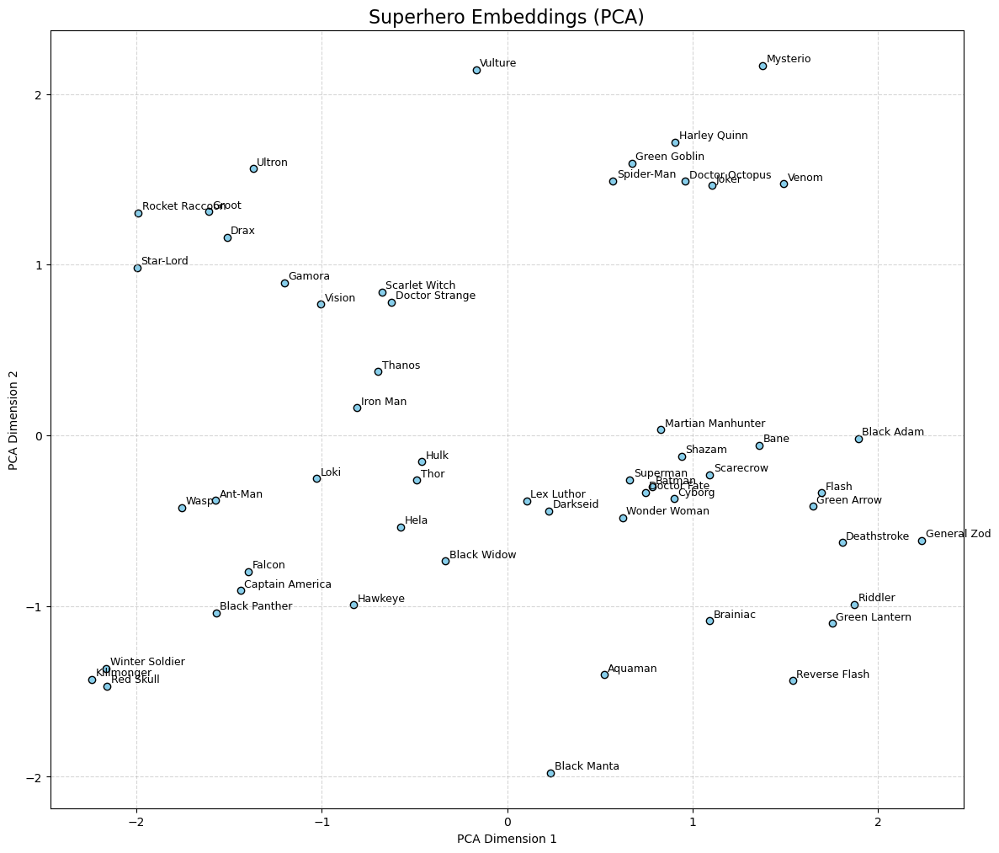

In [18]:
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def visualize_embeddings(embeddings, idx2word, title="Superhero Embeddings (PCA)"):
    """
    Visualize node embeddings in 2D using PCA.
    
    embeddings: torch.Tensor (vocab_size, embedding_dim)
    idx2word: dict mapping index -> word
    """
    # Convert to numpy
    emb = embeddings.detach().cpu().numpy()

    # Apply PCA to reduce to 2D
    pca = PCA(n_components=2)
    emb_2d = pca.fit_transform(emb)

    # Plot
    plt.figure(figsize=(14, 12))
    plt.scatter(emb_2d[:, 0], emb_2d[:, 1], c="skyblue", edgecolors="k")

    # Annotate each point with the word
    for i, word in idx2word.items():
        plt.text(emb_2d[i, 0] + 0.02, emb_2d[i, 1] + 0.02, word, fontsize=9)

    plt.title(title, fontsize=16)
    plt.xlabel("PCA Dimension 1")
    plt.ylabel("PCA Dimension 2")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()


# Example usage
embeddings = model.target_embeddings.weight.data
visualize_embeddings(embeddings, idx2word)


/home/mudasir/miniconda3/envs/ankit_NLP/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Generating walks (CPU: 3): 100%|██████████| 75/75 [00:00<00:00, 123.39it/s]


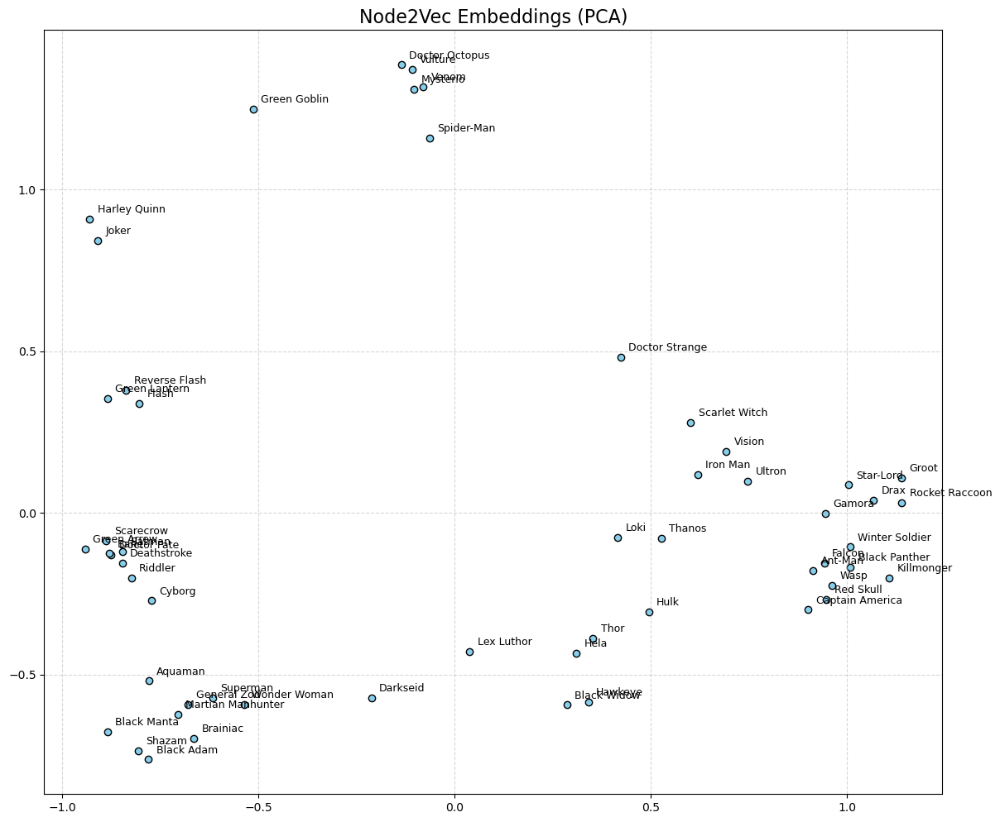

Top 5 similar to Batman: [('Doctor Fate', 0.8548468351364136), ('Scarecrow', 0.8510980010032654), ('Bane', 0.8505923748016357), ('Deathstroke', 0.841888427734375), ('Green Arrow', 0.8408247232437134)]
Top 5 similar to Iron Man: [('Ultron', 0.5997902154922485), ('Black Panther', 0.5954491496086121), ('Vision', 0.5870336890220642), ('Scarlet Witch', 0.5765665173530579), ('Winter Soldier', 0.5654803514480591)]


In [19]:
import networkx as nx
from node2vec import Node2Vec
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# 1. Build the graph
G = nx.Graph()
G.add_nodes_from(superheroes)        # superheroes + villains
G.add_edges_from(relationships)      # their relationships

# 2. Initialize Node2Vec model
node2vec = Node2Vec(
    G,
    dimensions=64,      # size of embedding
    walk_length=30,     # length of each random walk
    num_walks=300,      # number of random walks per node
    p=1, q=1,           # parameters controlling BFS/DFS bias
    workers=4,          # number of CPU cores
    seed=42
)

# 3. Train embeddings (Word2Vec under the hood)
model = node2vec.fit(window=5, min_count=1, batch_words=4)

# 4. Get embeddings for each character
embeddings = {node: model.wv[node] for node in G.nodes()}

# 5. Visualize with PCA
def visualize_embeddings(embeddings, title="Node2Vec Embeddings (PCA)"):
    labels = list(embeddings.keys())
    vectors = list(embeddings.values())

    pca = PCA(n_components=2)
    reduced = pca.fit_transform(vectors)

    plt.figure(figsize=(14, 12))
    plt.scatter(reduced[:, 0], reduced[:, 1], c="skyblue", edgecolors="k")

    for i, label in enumerate(labels):
        plt.text(reduced[i, 0] + 0.02, reduced[i, 1] + 0.02, label, fontsize=9)

    plt.title(title, fontsize=16)
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

visualize_embeddings(embeddings)

# 6. Example: Find similar characters
print("Top 5 similar to Batman:", model.wv.most_similar("Batman", topn=5))
print("Top 5 similar to Iron Man:", model.wv.most_similar("Iron Man", topn=5))


In [20]:
import random
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report
from sklearn.svm import SVC


In [57]:
train_texts, train_labels, test_texts, test_labels = [], [], [], []

for label, texts in docs.items():
    random.shuffle(texts)
    split = int(0.8 * len(texts))  # 80% train, 20% test

    train_texts.extend(texts[:split])
    train_labels.extend([label] * split)

    test_texts.extend(texts[split:])
    test_labels.extend([label] * (len(texts) - split))

print(f"Train size: {len(train_texts)}, Test size: {len(test_texts)}")

Train size: 1777, Test size: 448


In [58]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(train_texts)
y = np.array(train_labels)

In [59]:
def cross_validate_model(model, X, y, folds=5):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    fold_results = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y), 1):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)

        acc = accuracy_score(y_val, y_pred)
        precision, recall, f1, _ = precision_recall_fscore_support(
            y_val, y_pred, average="weighted", zero_division=0
        )

        fold_results.append((acc, precision, recall, f1))
        print(f"\nFold {fold} results:\n", classification_report(y_val, y_pred, zero_division=0))

    return fold_results

In [67]:
print("\n=== Logistic Regression Results ===")
lr_model = LogisticRegression(max_iter=1000)
lr_results = cross_validate_model(lr_model, X, y)



=== Logistic Regression Results ===

Fold 1 results:
                precision    recall  f1-score   support

     business       0.96      0.96      0.96        81
entertainment       0.97      0.97      0.97        62
     politics       0.97      0.97      0.97        67
        sport       1.00      0.99      0.99        82
         tech       0.95      0.97      0.96        64

     accuracy                           0.97       356
    macro avg       0.97      0.97      0.97       356
 weighted avg       0.97      0.97      0.97       356


Fold 2 results:
                precision    recall  f1-score   support

     business       0.94      0.98      0.96        82
entertainment       1.00      0.97      0.98        61
     politics       0.97      0.97      0.97        67
        sport       0.99      1.00      0.99        82
         tech       0.98      0.95      0.97        64

     accuracy                           0.97       356
    macro avg       0.98      0.97      0.

In [68]:
print("\n=== Support Vector Machine Results ===")
svm_model = SVC(kernel="linear", probability=True, random_state=42)
svm_results = cross_validate_model(svm_model, X, y)



=== Support Vector Machine Results ===

Fold 1 results:
                precision    recall  f1-score   support

     business       0.95      0.96      0.96        81
entertainment       0.98      0.97      0.98        62
     politics       0.97      0.97      0.97        67
        sport       1.00      0.99      0.99        82
         tech       0.95      0.97      0.96        64

     accuracy                           0.97       356
    macro avg       0.97      0.97      0.97       356
 weighted avg       0.97      0.97      0.97       356


Fold 2 results:
                precision    recall  f1-score   support

     business       0.96      0.98      0.97        82
entertainment       1.00      0.98      0.99        61
     politics       0.96      0.96      0.96        67
        sport       1.00      1.00      1.00        82
         tech       0.98      0.98      0.98        64

     accuracy                           0.98       356
    macro avg       0.98      0.98     

In [72]:
def summarize_results(name, results):
    avg_acc = np.mean([r[0] for r in results])
    avg_prec = np.mean([r[1] for r in results])
    avg_rec = np.mean([r[2] for r in results])
    avg_f1 = np.mean([r[3] for r in results])
    print(f"\n{name} Average across 5 folds:")
    print(f"Accuracy:  {avg_acc:.4f}")
    print(f"Precision: {avg_prec:.4f}")
    print(f"Recall:    {avg_rec:.4f}")
    print(f"F1-score:  {avg_f1:.4f}")
    return avg_acc, avg_prec, avg_rec, avg_f1

lr_avg = summarize_results("Logistic Regression", lr_results)
svm_avg = summarize_results("SVM", svm_results)


Logistic Regression Average across 5 folds:
Accuracy:  0.9752
Precision: 0.9756
Recall:    0.9752
F1-score:  0.9752

SVM Average across 5 folds:
Accuracy:  0.9786
Precision: 0.9788
Recall:    0.9786
F1-score:  0.9786


In [69]:
import numpy as np

def classify_document(document, vectorizer, lr_model, svm_model):
    # Transform the input document using the trained TF-IDF vectorizer
    X_doc = vectorizer.transform([document])
    
    # Predict with Logistic Regression model
    lr_prediction = lr_model.predict(X_doc)[0]
    lr_prob = lr_model.predict_proba(X_doc)[0]
    
    # Predict with SVM model
    svm_prediction = svm_model.predict(X_doc)[0]
    svm_prob = svm_model.predict_proba(X_doc)[0]
    
    # Return results
    return {
        "document": document,
        "logistic_regression": {
            "predicted_label": lr_prediction,
            "probabilities": dict(zip(lr_model.classes_, lr_prob))
        },
        "svm": {
            "predicted_label": svm_prediction,
            "probabilities": dict(zip(svm_model.classes_, svm_prob))
        }
    }



In [71]:

# Example document (replace with your own document text)
sample_document = "The firm, which is now one of the biggest investors in Google, benefited from sales of high-speed internet connections and higher advert sales."

# Assuming vectorizer, lr_model, and svm_model are already trained
result = classify_document(sample_document, vectorizer, lr_model, svm_model)

print("Classification Results:")
print(f"Document: {result['document']}")
print("\nLogistic Regression:")
print(f"Predicted Label: {result['logistic_regression']['predicted_label']}")
print(f"Probabilities: {result['logistic_regression']['probabilities']}")
print("\nSVM:")
print(f"Predicted Label: {result['svm']['predicted_label']}")
print(f"Probabilities: {result['svm']['probabilities']}")

Classification Results:
Document: The firm, which is now one of the biggest investors in Google, benefited from sales of high-speed internet connections and higher advert sales.

Logistic Regression:
Predicted Label: business
Probabilities: {'business': 0.34102097647935375, 'entertainment': 0.12061941100595888, 'politics': 0.08199465759598762, 'sport': 0.12907175905567703, 'tech': 0.32729319586302263}

SVM:
Predicted Label: business
Probabilities: {'business': 0.5419742653879587, 'entertainment': 0.013366190743707233, 'politics': 0.007482551601207647, 'sport': 0.010756110272777035, 'tech': 0.4264208819943495}
